In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install kaggle

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download hmchuong/xray-bone-shadow-supression

100% 5.22G/5.23G [01:42<00:00, 30.9MB/s]
100% 5.23G/5.23G [01:42<00:00, 54.8MB/s]


In [ ]:
! unzip /content/xray-bone-shadow-supression.zip

Streaming output truncated to the last 5000 lines.
  inflating: augmented/augmented/source/8_136.png  
  inflating: augmented/augmented/source/8_137.png  
  inflating: augmented/augmented/source/8_138.png  
  inflating: augmented/augmented/source/8_139.png  
  inflating: augmented/augmented/source/8_14.png  
  inflating: augmented/augmented/source/8_140.png  
  inflating: augmented/augmented/source/8_141.png  
  inflating: augmented/augmented/source/8_142.png  
  inflating: augmented/augmented/source/8_143.png  
  inflating: augmented/augmented/source/8_144.png  
  inflating: augmented/augmented/source/8_145.png  
  inflating: augmented/augmented/source/8_146.png  
  inflating: augmented/augmented/source/8_147.png  
  inflating: augmented/augmented/source/8_148.png  
  inflating: augmented/augmented/source/8_149.png  
  inflating: augmented/augmented/source/8_15.png  
  inflating: augmented/augmented/source/8_150.png  
  inflating: augmented/augmented/source/8_151.png  
  inflating: au

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from keras.layers import Input,Dense,Conv2D,MaxPooling2D,UpSampling2D
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from keras.models import Model
from tensorflow.keras.optimizers import RMSprop

In [ ]:
DATA="/content/augmented/augmented"

In [ ]:
trainer=ImageDataGenerator(rescale=1/255)
tester=ImageDataGenerator()

train= trainer.flow_from_directory(
       DATA ,
        target_size=(256, 256),
        batch_size=32,
        class_mode='input',classes=['source'])
valid =trainer.flow_from_directory(
        DATA,
        target_size=(256, 256),
        batch_size=32,
        class_mode='input',classes=['target'])




Found 4080 images belonging to 1 classes.
Found 4080 images belonging to 1 classes.


In [ ]:
def autoencoder(input_img):
    #encoder
    #input = 28 x 28 x 1 (wide and thin)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img) #28 x 28 x 32
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1) #14 x 14 x 32
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1) #14 x 14 x 64
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2) #7 x 7 x 64
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2) #7 x 7 x 128 (small and thick)

    #decoder
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3) #7 x 7 x 128
    up1 = UpSampling2D((2,2))(conv4) # 14 x 14 x 128
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up1) # 14 x 14 x 64
    up2 = UpSampling2D((2,2))(conv5) # 28 x 28 x 64
    decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(up2) # 28 x 28 x 1
    return decoded

In [ ]:
from tensorflow.keras.layers import BatchNormalization
img_shape = (256,256,3)
input_img = Input(shape = img_shape)
autoencoder = Model(input_img, autoencoder(input_img))
autoencoder.compile(loss='mean_squared_error', optimizer = RMSprop())

In [ ]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856 

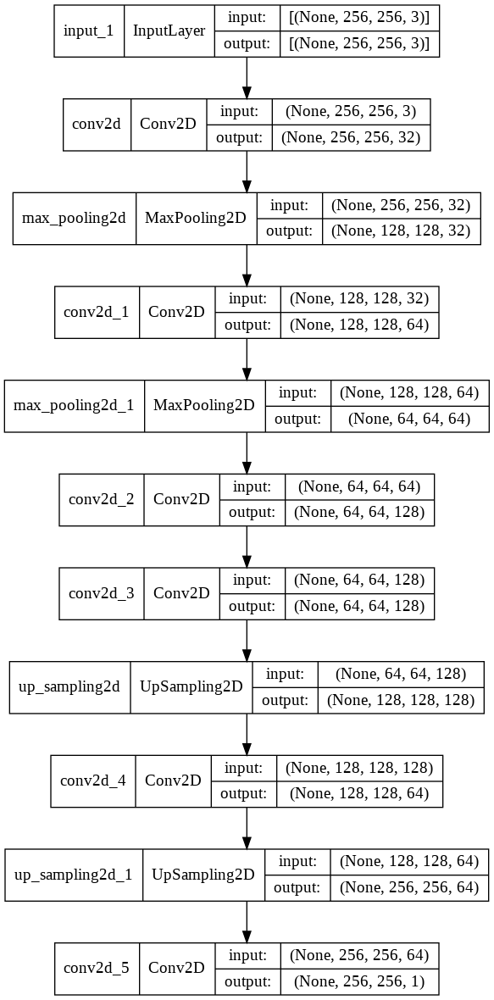

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(autoencoder, 'autoencoder_no_compress.png', show_shapes=True)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
import keras
early_stop = EarlyStopping(monitor='val_loss',patience=3)
checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Bone_supression_research/Models{epoch:08d}.h5', period=3)
hist=autoencoder.fit(train,
                 epochs=60,
                 batch_size=128,
                 validation_data=valid,callbacks=[early_stop,checkpoint])

Epoch 1/60
128/128 [==============================] - 163s 1s/step - loss: 0.0139 - val_loss: 0.0031
Epoch 2/60
128/128 [==============================] - 123s 961ms/step - loss: 0.0028 - val_loss: 0.0016
Epoch 3/60
128/128 [==============================] - 123s 960ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 4/60
128/128 [==============================] - 122s 956ms/step - loss: 0.0014 - val_loss: 9.2478e-04
Epoch 5/60
128/128 [==============================] - 124s 967ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 6/60
128/128 [==============================] - 123s 963ms/step - loss: 0.0010 - val_loss: 0.0011
Epoch 7/60
128/128 [==============================] - 122s 955ms/step - loss: 8.9390e-04 - val_loss: 7.6142e-04
Epoch 8/60
128/128 [==============================] - 122s 954ms/step - loss: 7.9084e-04 - val_loss: 7.0525e-04
Epoch 9/60
128/128 [==============================] - 122s 957ms/step - loss: 7.2586e-04 - val_loss: 7.1432e-04
Epoch 10/60
128/128 [==================

In [ ]:
import pandas as pd
metrics = pd.DataFrame(autoencoder.history.history)
print("The model metrics are")
metrics

The model metrics are


,loss,val_loss
0,0.013909,0.003067
1,0.002825,0.001638
2,0.001841,0.001367
3,0.001433,0.000925
4,0.001185,0.001347
5,0.001011,0.001128
6,0.000894,0.000761
7,0.000791,0.000705
8,0.000726,0.000714
9,0.000675,0.000785


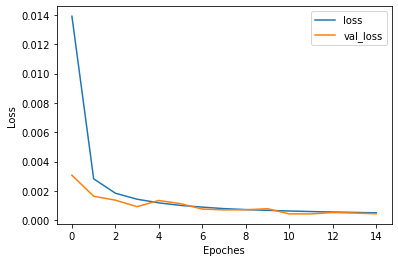

In [ ]:
metrics[['loss','val_loss']].plot()
plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.show()

In [ ]:
autoencoder.save('/content/drive/MyDrive/Bone_supression_research/Models/bonesup.h5')

In [ ]:
from keras.models import load_model
autoencoder=load_model("/content/drive/MyDrive/Bone_supression_research/Models/bonesup3.h5")

In [ ]:
tests=trainer.flow_from_directory(
        "/content/drive/MyDrive/Bone_supression_research/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')

Found 10 images belonging to 1 classes.


In [ ]:
pred=autoencoder.predict(tests)

In [ ]:
os.mkdir("/content/Test")
os.mkdir("/content/Test/Test")

Found 1 images belonging to 1 classes.


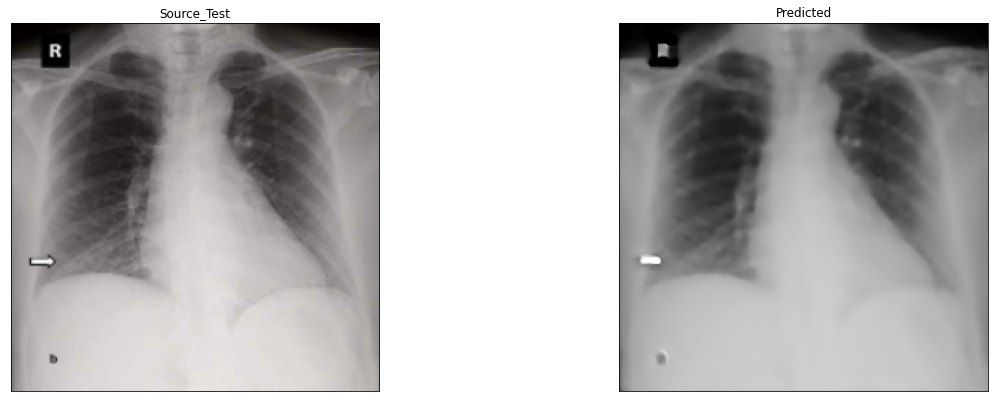

Found 1 images belonging to 1 classes.


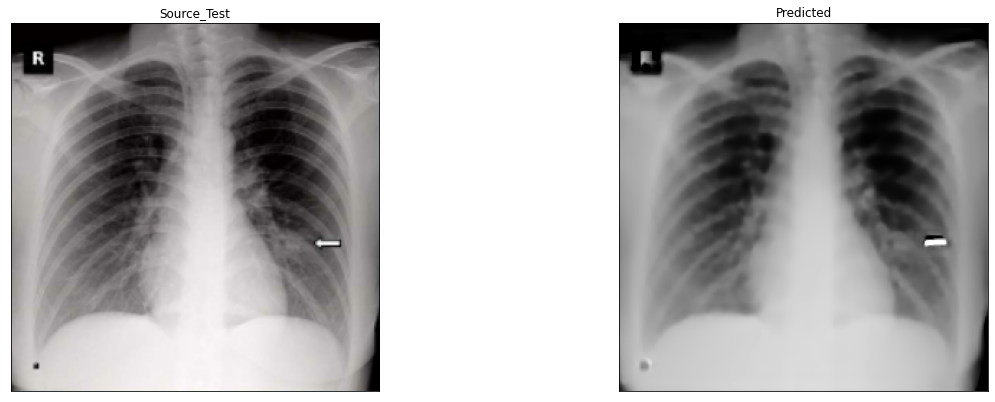

Found 1 images belonging to 1 classes.


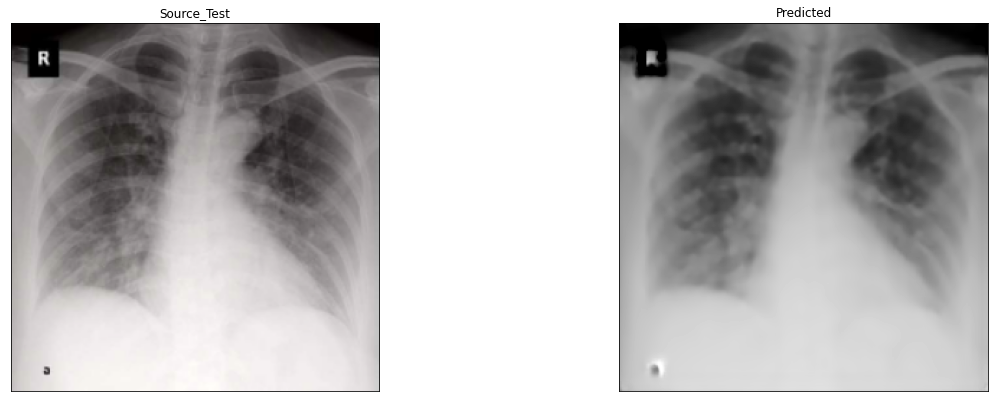

Found 1 images belonging to 1 classes.


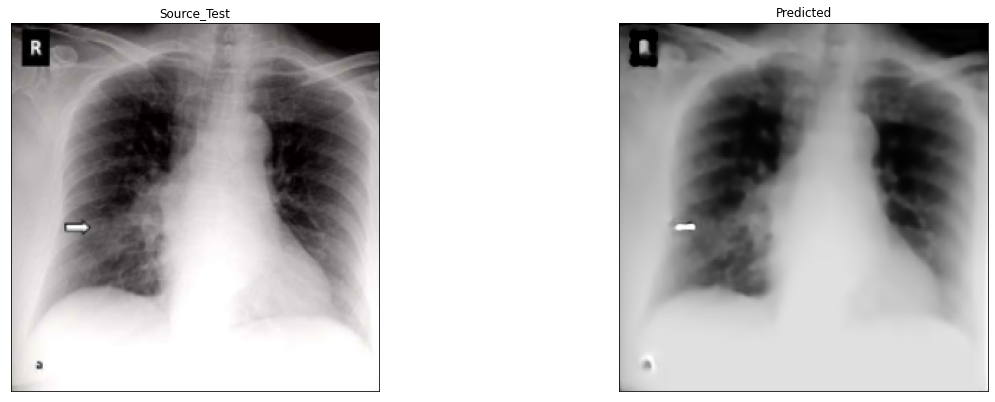

Found 1 images belonging to 1 classes.


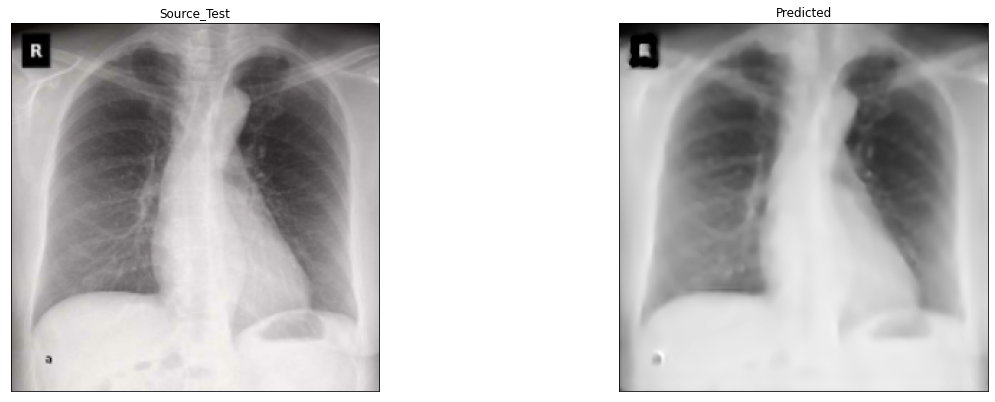

Found 1 images belonging to 1 classes.


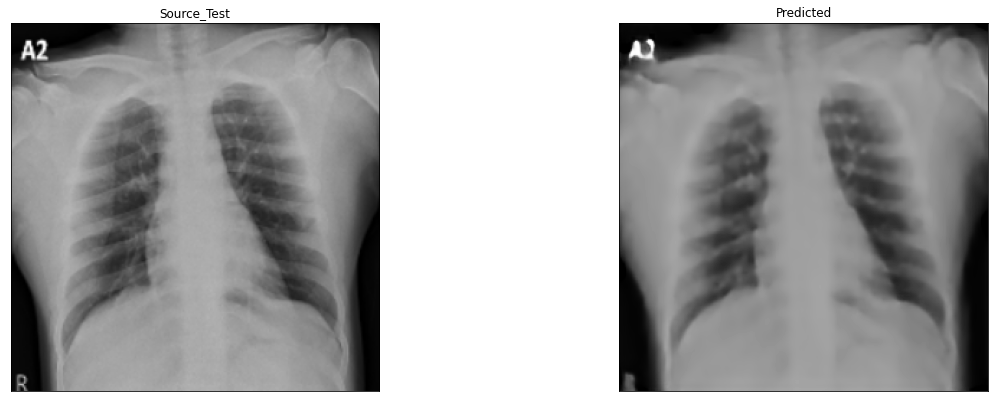

Found 1 images belonging to 1 classes.


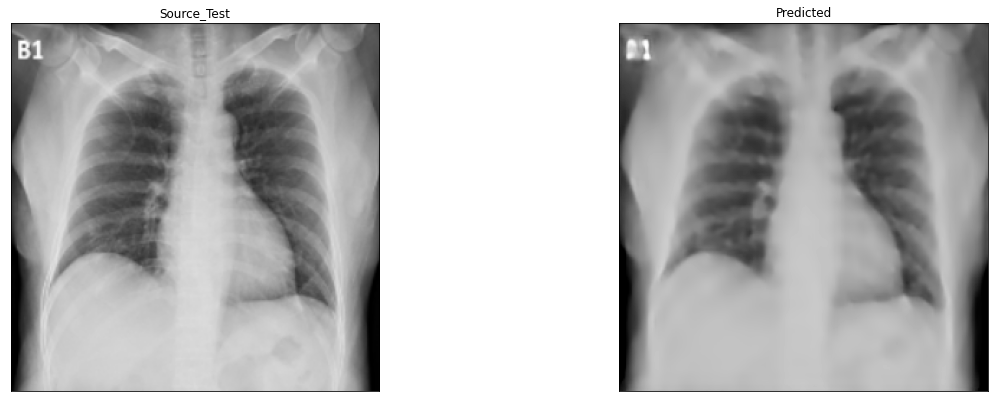

Found 1 images belonging to 1 classes.


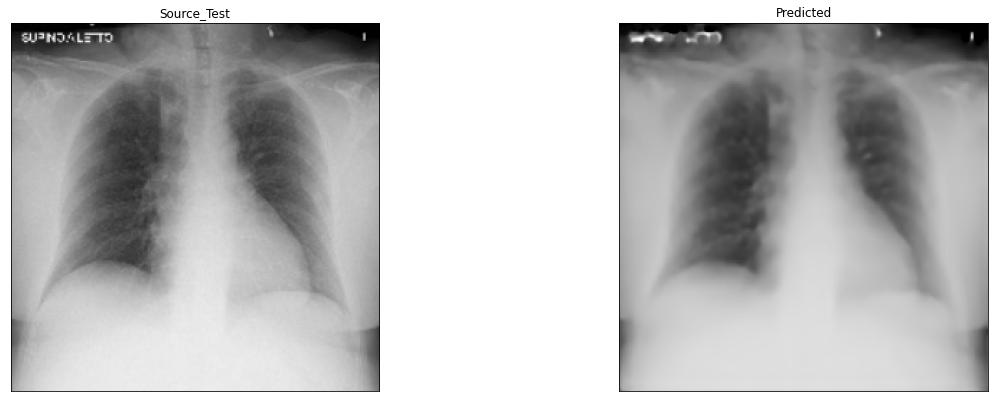

Found 1 images belonging to 1 classes.


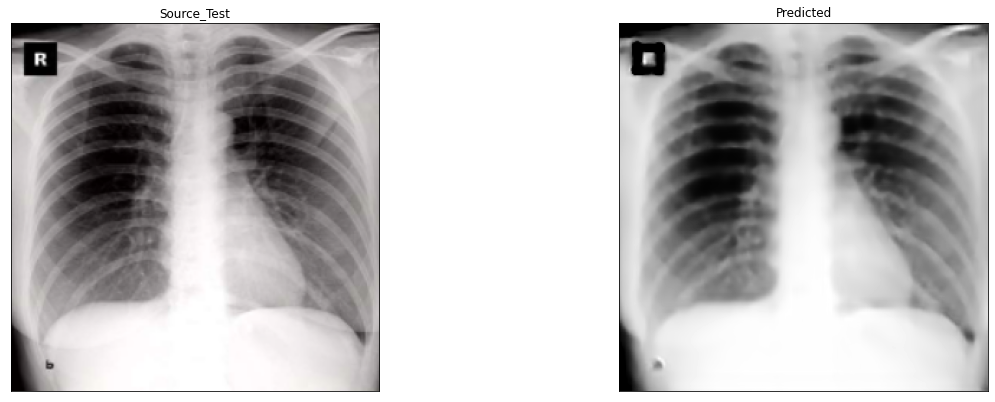

Found 1 images belonging to 1 classes.


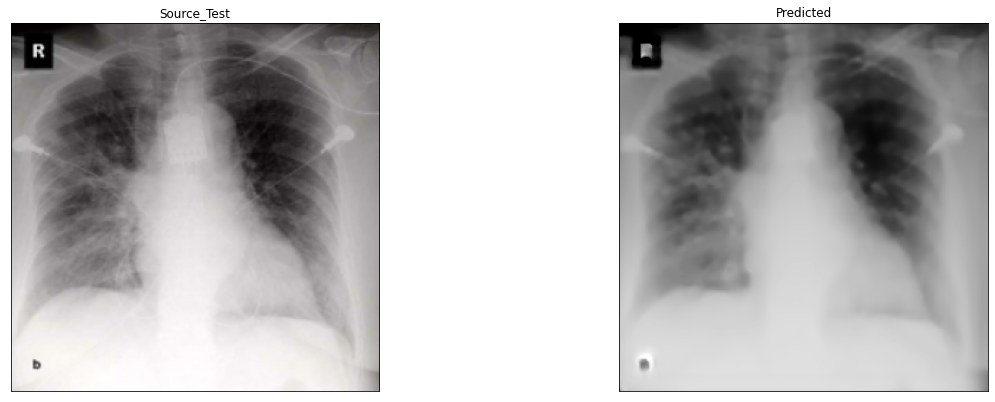

In [ ]:
folder="/content/drive/MyDrive/Bone_supression_research/Test/Test"

arr2=[1,3,5,7,9,11,13,15,17,19]
arr1=[2,4,6,8,10,12,14,16,18,20]
i=0
for filename in os.listdir(folder):
    plt.figure(figsize=(20,80))
    img = cv2.imread(os.path.join(folder,filename))
    img=cv2.resize(img, (256, 256))
    ax = plt.subplot(10, 2, arr2[i])
    plt.imshow(img)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Source_Test')

    
    temp3=os.path.join('/content/Test/Test',filename)
    cv2.imwrite(temp3,img)
    
    tests=trainer.flow_from_directory(
        "/content/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')
    temp_pred=autoencoder.predict(tests)
    os.remove(temp3)
    ax = plt.subplot(10, 2, arr1[i])
    plt.imshow(temp_pred[0].reshape(256,256))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Predicted')
    plt.show()
    i+=1
    

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
import keras
from keras.models import load_model
autoencoder=load_model("/content/drive/MyDrive/Bone_supression_research/Models/bonesup.h5")
early_stop = EarlyStopping(monitor='val_loss',patience=8)
checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Bone_supression_research/Models2nd{epoch:08d}.h5', period=5)
hist=autoencoder.fit(train,
                 epochs=80,
                 batch_size=128,
                 validation_data=valid,callbacks=[early_stop,checkpoint])

Epoch 1/80
128/128 [==============================] - 181s 1s/step - loss: 4.8108e-04 - val_loss: 4.7124e-04
Epoch 2/80
128/128 [==============================] - 144s 1s/step - loss: 4.6539e-04 - val_loss: 5.4217e-04
Epoch 3/80
128/128 [==============================] - 141s 1s/step - loss: 4.4283e-04 - val_loss: 4.0576e-04
Epoch 4/80
128/128 [==============================] - 140s 1s/step - loss: 4.2498e-04 - val_loss: 3.5389e-04
Epoch 5/80
128/128 [==============================] - 139s 1s/step - loss: 4.0890e-04 - val_loss: 6.1927e-04
Epoch 6/80
128/128 [==============================] - 138s 1s/step - loss: 4.0078e-04 - val_loss: 4.5674e-04
Epoch 7/80
128/128 [==============================] - 139s 1s/step - loss: 3.9020e-04 - val_loss: 6.1748e-04
Epoch 8/80
128/128 [==============================] - 141s 1s/step - loss: 3.6782e-04 - val_loss: 3.5874e-04
Epoch 9/80
128/128 [==============================] - 141s 1s/step - loss: 3.6490e-04 - val_loss: 3.1608e-04
Epoch 10/80
128/128

KeyboardInterrupt: ignored

In [ ]:
import pandas as pd
metrics = pd.DataFrame(autoencoder.history.history)
print("The model metrics are")
metrics

The model metrics are


,loss,val_loss
0,0.000481,0.000471
1,0.000465,0.000542
2,0.000443,0.000406
3,0.000425,0.000354
4,0.000409,0.000619
5,0.000401,0.000457
6,0.000390,0.000617
7,0.000368,0.000359
8,0.000365,0.000316
9,0.000355,0.000333


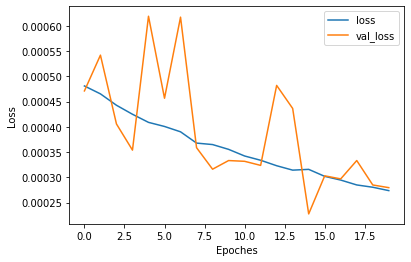

In [ ]:
metrics[['loss','val_loss']].plot()
plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.show()

In [ ]:
autoencoder.save('/content/drive/MyDrive/Bone_supression_research/Models/bonesup1.h5')

In [ ]:
tests=trainer.flow_from_directory(
        "/content/drive/MyDrive/Bone_supression_research/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')

Found 10 images belonging to 1 classes.


In [ ]:
pred=autoencoder.predict(tests)

In [ ]:
os.mkdir("/content/Test")
os.mkdir("/content/Test/Test")

Found 1 images belonging to 1 classes.


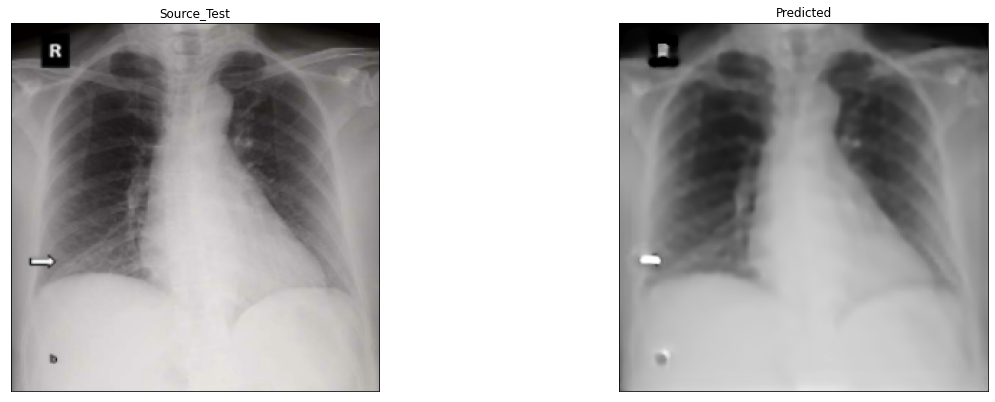

Found 1 images belonging to 1 classes.


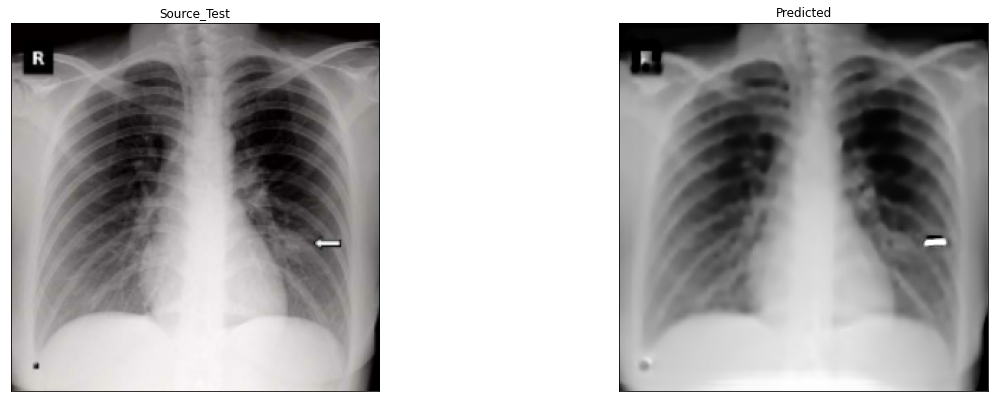

Found 1 images belonging to 1 classes.


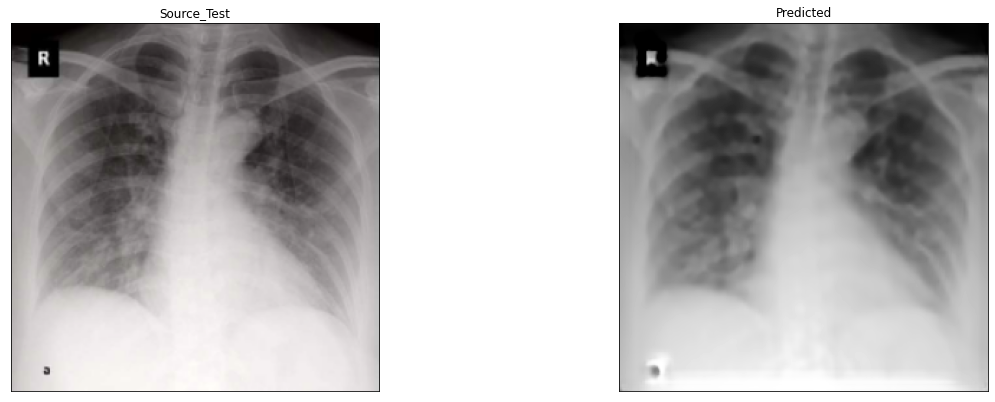

Found 1 images belonging to 1 classes.


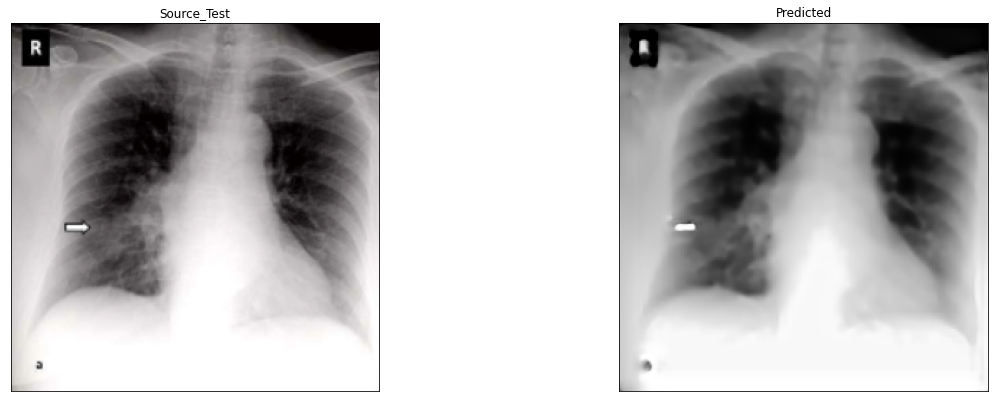

Found 1 images belonging to 1 classes.


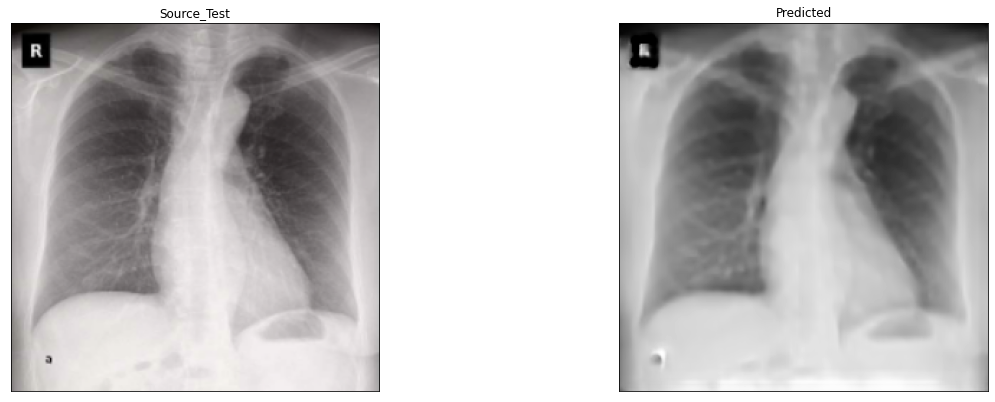

Found 1 images belonging to 1 classes.


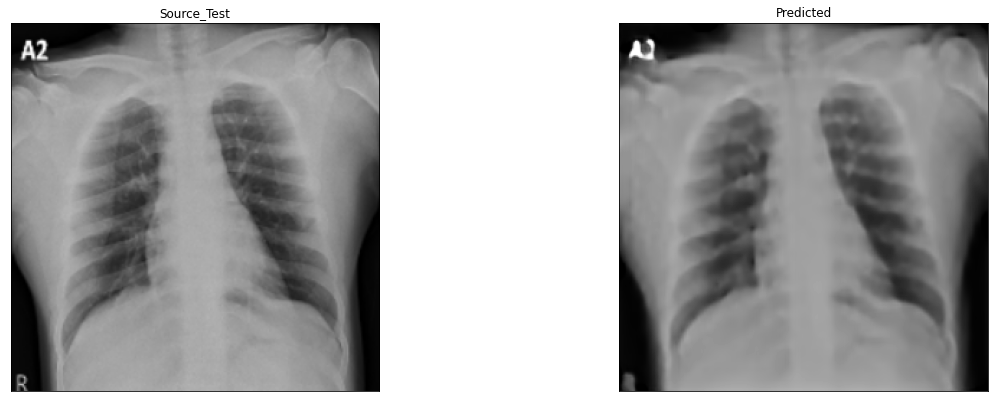

Found 1 images belonging to 1 classes.


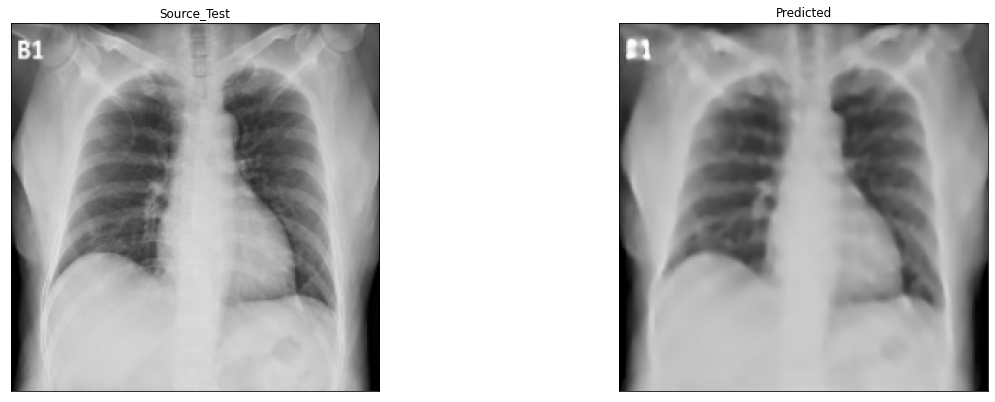

Found 1 images belonging to 1 classes.


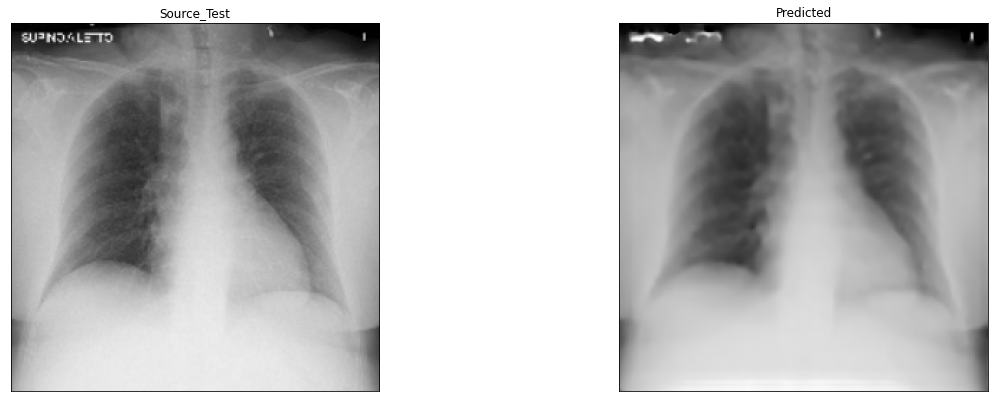

Found 1 images belonging to 1 classes.


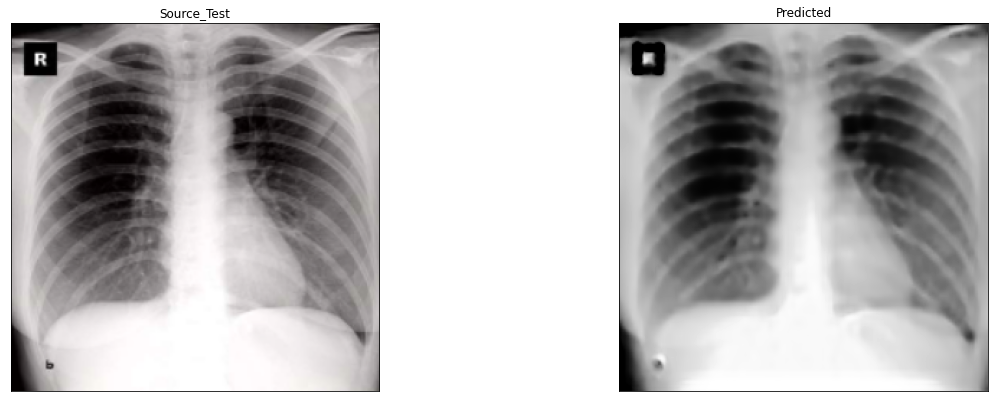

Found 1 images belonging to 1 classes.


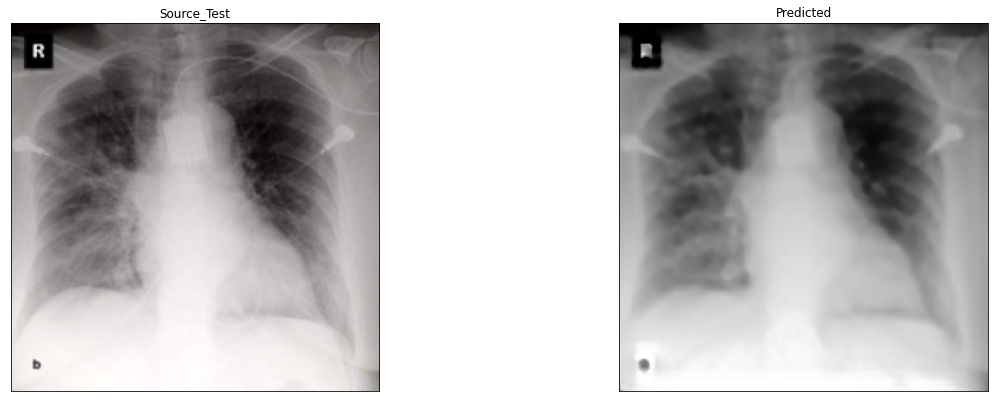

In [ ]:
folder="/content/drive/MyDrive/Bone_supression_research/Test/Test"

arr2=[1,3,5,7,9,11,13,15,17,19]
arr1=[2,4,6,8,10,12,14,16,18,20]
i=0
for filename in os.listdir(folder):
    plt.figure(figsize=(20,80))
    img = cv2.imread(os.path.join(folder,filename))
    img=cv2.resize(img, (256, 256))
    ax = plt.subplot(10, 2, arr2[i])
    plt.imshow(img)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Source_Test')

    
    temp3=os.path.join('/content/Test/Test',filename)
    cv2.imwrite(temp3,img)
    
    tests=trainer.flow_from_directory(
        "/content/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')
    temp_pred=autoencoder.predict(tests)
    os.remove(temp3)
    ax = plt.subplot(10, 2, arr1[i])
    plt.imshow(temp_pred[0].reshape(256,256))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Predicted')
    plt.show()
    i+=1
    

Found 1 images belonging to 1 classes.


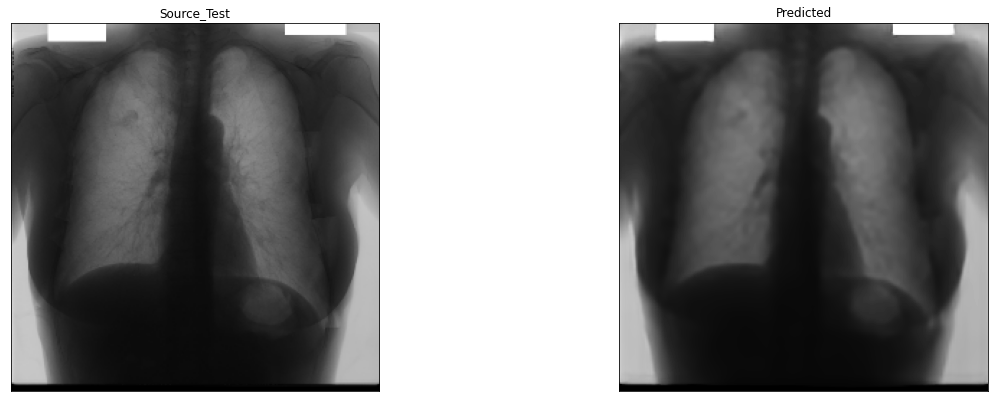

Found 1 images belonging to 1 classes.


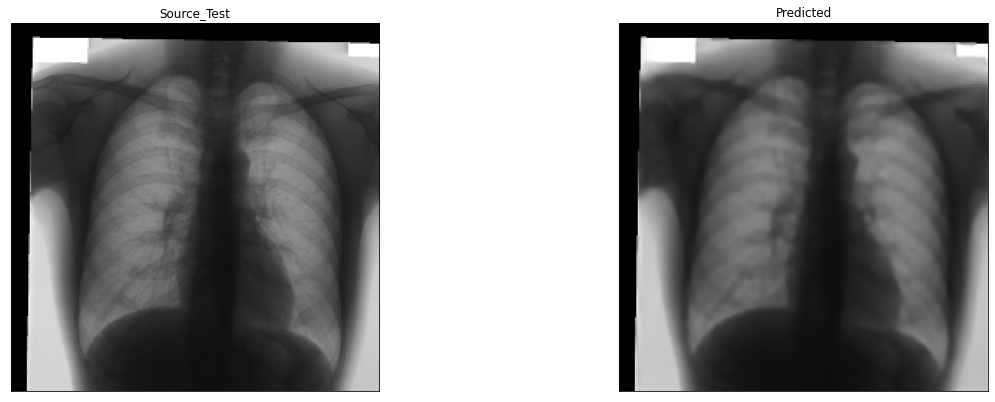

Found 1 images belonging to 1 classes.


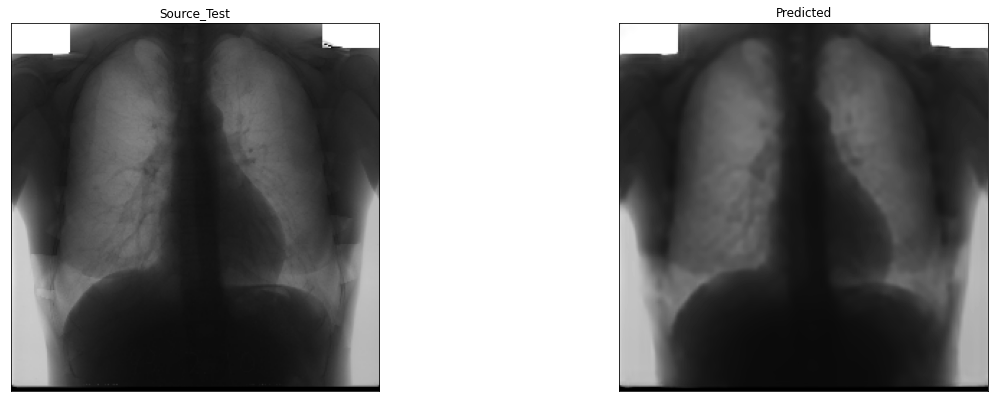

Found 1 images belonging to 1 classes.


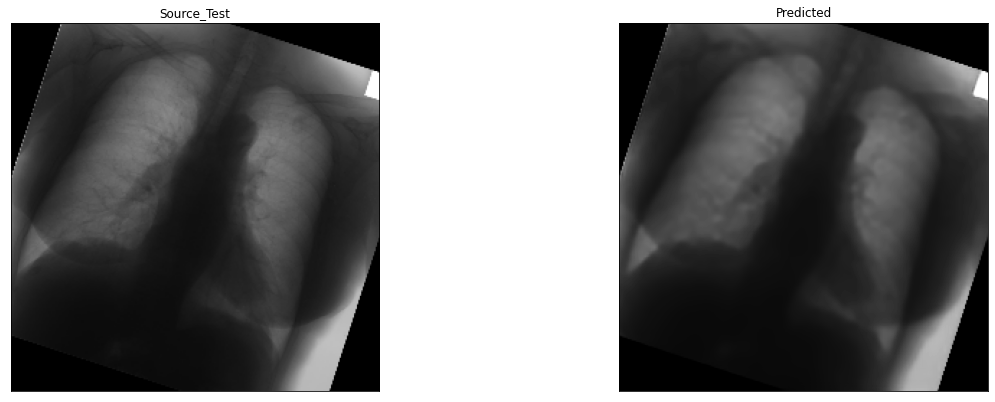

Found 1 images belonging to 1 classes.


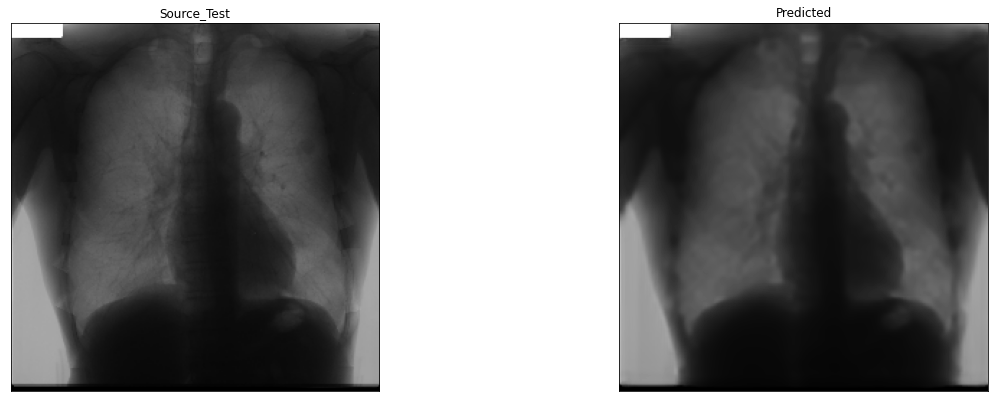

Found 1 images belonging to 1 classes.


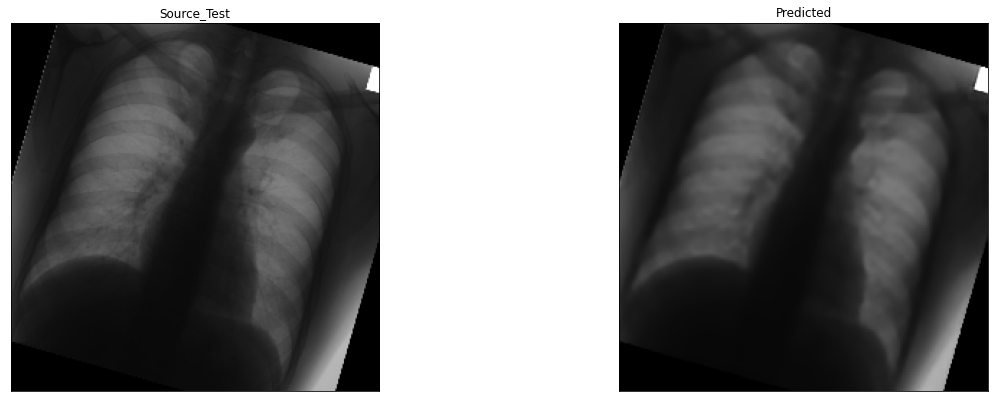

In [ ]:
folder="/content/F"

arr2=[1,3,5,7,9,11,13,15,17,19]
arr1=[2,4,6,8,10,12,14,16,18,20]
i=0
for filename in os.listdir(folder):
    plt.figure(figsize=(20,80))
    img = cv2.imread(os.path.join(folder,filename))
    img=cv2.resize(img, (256, 256))
    ax = plt.subplot(10, 2, arr2[i])
    plt.imshow(img)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Source_Test')

    
    temp3=os.path.join('/content/Test/Test',filename)
    cv2.imwrite(temp3,img)
    
    tests=trainer.flow_from_directory(
        "/content/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')
    temp_pred=autoencoder.predict(tests)
    os.remove(temp3)
    ax = plt.subplot(10, 2, arr1[i])
    plt.imshow(temp_pred[0].reshape(256,256))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Predicted')
    plt.show()
    i+=1
    

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
import keras
from keras.models import load_model
autoencoder=load_model("/content/drive/MyDrive/Bone_supression_research/Models/bonesup1.h5")
early_stop = EarlyStopping(monitor='val_loss',patience=8)
checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Bone_supression_research/Models3rd{epoch:08d}.h5', period=10)
hist=autoencoder.fit(train,
                 epochs=80,
                 batch_size=128,
                 validation_data=valid,callbacks=[early_stop,checkpoint])

Epoch 1/80
128/128 [==============================] - 192s 1s/step - loss: 2.7012e-04 - val_loss: 2.8191e-04
Epoch 2/80
128/128 [==============================] - 150s 1s/step - loss: 2.6163e-04 - val_loss: 2.4868e-04
Epoch 3/80
128/128 [==============================] - 150s 1s/step - loss: 2.6198e-04 - val_loss: 2.3766e-04
Epoch 4/80
128/128 [==============================] - 151s 1s/step - loss: 2.5275e-04 - val_loss: 2.7974e-04
Epoch 5/80
128/128 [==============================] - 151s 1s/step - loss: 2.4941e-04 - val_loss: 3.4740e-04
Epoch 6/80
128/128 [==============================] - 151s 1s/step - loss: 2.5009e-04 - val_loss: 5.4584e-04
Epoch 7/80
128/128 [==============================] - 150s 1s/step - loss: 2.4017e-04 - val_loss: 2.8588e-04
Epoch 8/80
128/128 [==============================] - 150s 1s/step - loss: 2.3732e-04 - val_loss: 2.4758e-04
Epoch 9/80
128/128 [==============================] - 150s 1s/step - loss: 2.3453e-04 - val_loss: 2.2904e-04
Epoch 10/80
128/128

In [ ]:
import pandas as pd
metrics = pd.DataFrame(autoencoder.history.history)
print("The model metrics are")
metrics

The model metrics are


,loss,val_loss
0,0.000270,0.000282
1,0.000262,0.000249
2,0.000262,0.000238
3,0.000253,0.000280
4,0.000249,0.000347
5,0.000250,0.000546
6,0.000240,0.000286
7,0.000237,0.000248
8,0.000235,0.000229
9,0.000230,0.000232


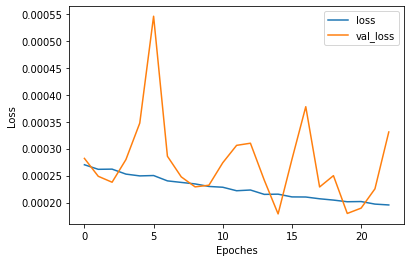

In [ ]:
metrics[['loss','val_loss']].plot()
plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.show()

In [ ]:
autoencoder.save('/content/drive/MyDrive/Bone_supression_research/Models/bonesup3.h5')

In [ ]:
tests=trainer.flow_from_directory(
        "/content/drive/MyDrive/Bone_supression_research/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')

Found 10 images belonging to 1 classes.


In [ ]:
pred=autoencoder.predict(tests)

In [ ]:
os.mkdir("/content/Test")
os.mkdir("/content/Test/Test")

Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)
Found 1 images belonging to 1 classes.
(1, 4)


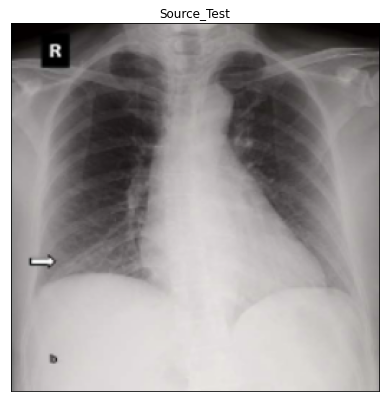

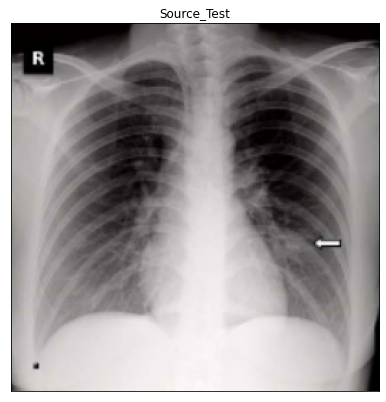

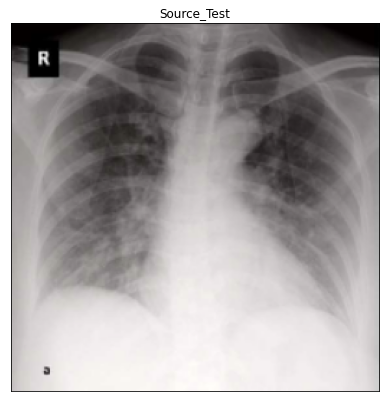

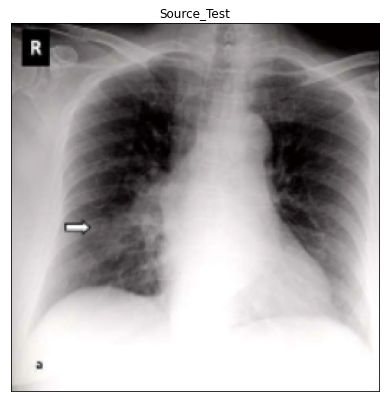

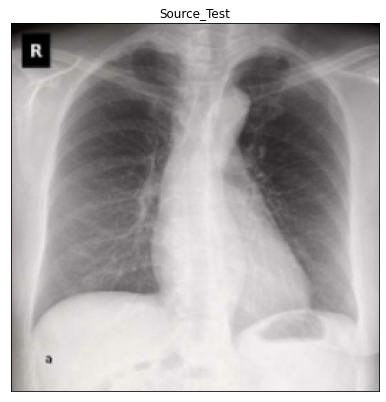

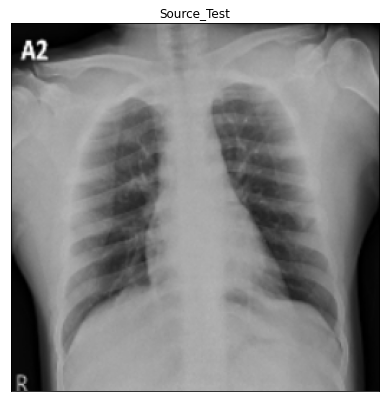

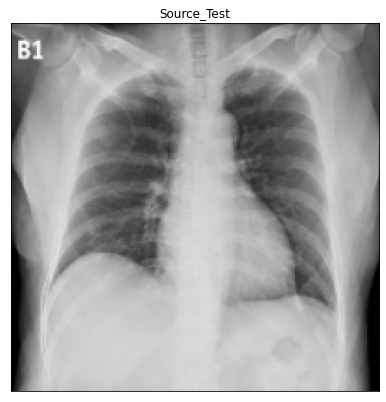

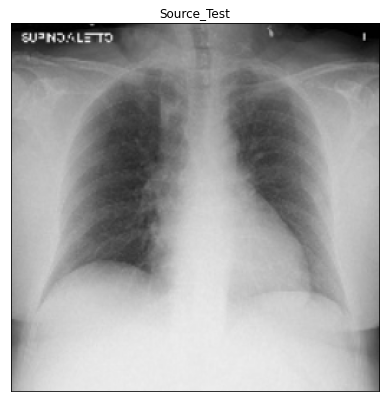

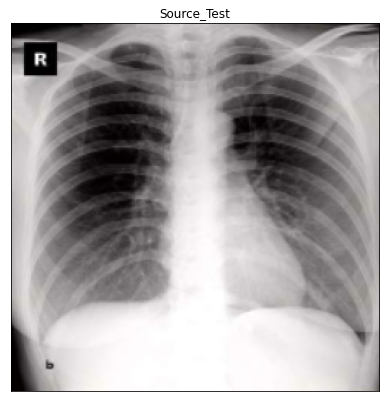

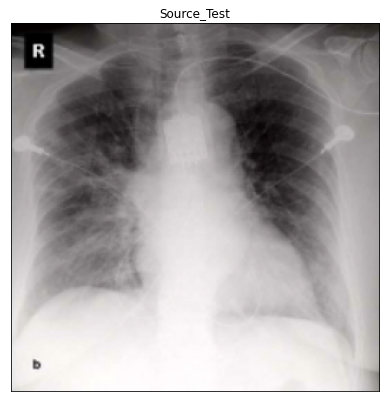

In [ ]:
folder="/content/drive/MyDrive/Bone_supression_research/Test/Test"

arr2=[1,3,5,7,9,11,13,15,17,19]
arr1=[2,4,6,8,10,12,14,16,18,20]
i=0
for filename in os.listdir(folder):
    plt.figure(figsize=(20,80))
    img = cv2.imread(os.path.join(folder,filename))
    img=cv2.resize(img, (256, 256))
    ax = plt.subplot(10, 2, arr2[i])
    plt.imshow(img)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Source_Test')

    
    temp3=os.path.join('/content/Test/Test',filename)
    cv2.imwrite(temp3,img)
    
    tests=trainer.flow_from_directory(
        "/content/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')
    
    temp_pred=autoencoder.predict(tests)
    os.remove(temp3)
    print(temp_pred.shape)
    '''
    ax = plt.subplot(10, 2, arr1[i])
    plt.imshow(temp_pred[0])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Predicted')
    plt.show()
    i+=1
    '''
    

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
import keras
from keras.models import load_model
autoencoder=load_model("/content/drive/MyDrive/Bone_supression_research/Models/bonesup3.h5")
early_stop = EarlyStopping(monitor='val_loss',patience=10)
checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Bone_supression_research/ModelsFinal{epoch:08d}.h5', period=5)
hist=autoencoder.fit(train,
                 epochs=80,
                 batch_size=128,
                 validation_data=valid,callbacks=[early_stop,checkpoint])

Epoch 1/80
128/128 [==============================] - 185s 1s/step - loss: 1.8963e-04 - val_loss: 1.9209e-04
Epoch 2/80
128/128 [==============================] - 144s 1s/step - loss: 1.9313e-04 - val_loss: 1.9313e-04
Epoch 3/80
128/128 [==============================] - 145s 1s/step - loss: 1.8726e-04 - val_loss: 2.1338e-04
Epoch 4/80
128/128 [==============================] - 144s 1s/step - loss: 1.8801e-04 - val_loss: 1.5880e-04
Epoch 5/80
128/128 [==============================] - 144s 1s/step - loss: 1.8461e-04 - val_loss: 1.7018e-04
Epoch 6/80
128/128 [==============================] - 143s 1s/step - loss: 1.8241e-04 - val_loss: 2.4588e-04
Epoch 7/80
128/128 [==============================] - 143s 1s/step - loss: 1.8299e-04 - val_loss: 2.4271e-04
Epoch 8/80
128/128 [==============================] - 144s 1s/step - loss: 1.7890e-04 - val_loss: 2.1087e-04
Epoch 9/80
128/128 [==============================] - 145s 1s/step - loss: 1.7732e-04 - val_loss: 2.4286e-04
Epoch 10/80
128/128

In [ ]:
import pandas as pd
metrics = pd.DataFrame(autoencoder.history.history)
print("The model metrics are")
metrics

The model metrics are


,loss,val_loss
0,0.000190,0.000192
1,0.000193,0.000193
2,0.000187,0.000213
3,0.000188,0.000159
4,0.000185,0.000170
5,0.000182,0.000246
6,0.000183,0.000243
7,0.000179,0.000211
8,0.000177,0.000243
9,0.000178,0.000178


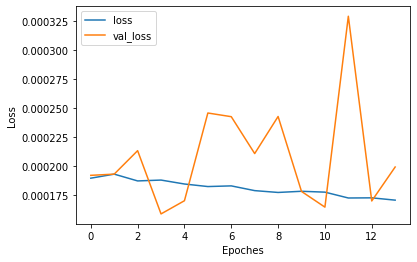

In [ ]:
metrics[['loss','val_loss']].plot()
plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.show()

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
import keras

checkpoint = keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/Bone_supression_research/ModelsFinal1{epoch:08d}.h5', period=5)
hist=autoencoder.fit(train,
                 epochs=80,
                 batch_size=128,
                 validation_data=valid,callbacks=[checkpoint])

Epoch 1/80
128/128 [==============================] - 146s 1s/step - loss: 1.6837e-04 - val_loss: 1.7747e-04
Epoch 2/80
128/128 [==============================] - 145s 1s/step - loss: 1.6818e-04 - val_loss: 2.1856e-04
Epoch 3/80
128/128 [==============================] - 146s 1s/step - loss: 1.6707e-04 - val_loss: 1.5820e-04
Epoch 4/80
128/128 [==============================] - 145s 1s/step - loss: 1.6470e-04 - val_loss: 2.4370e-04
Epoch 5/80
128/128 [==============================] - 145s 1s/step - loss: 1.6291e-04 - val_loss: 2.1851e-04
Epoch 6/80
128/128 [==============================] - 145s 1s/step - loss: 1.6201e-04 - val_loss: 3.2366e-04
Epoch 7/80
128/128 [==============================] - 145s 1s/step - loss: 1.6084e-04 - val_loss: 2.1402e-04
Epoch 8/80
128/128 [==============================] - 145s 1s/step - loss: 1.5983e-04 - val_loss: 2.0655e-04
Epoch 9/80
128/128 [==============================] - 144s 1s/step - loss: 1.5772e-04 - val_loss: 1.5232e-04
Epoch 10/80
128/128

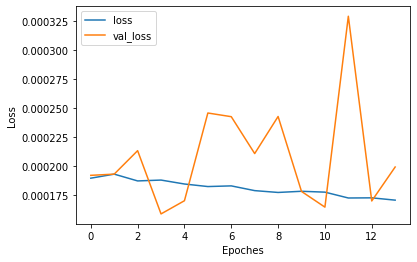

In [ ]:
metrics[['loss','val_loss']].plot()
plt.xlabel('Epoches')
plt.ylabel('Loss')
plt.show()

In [ ]:
import keras
from keras.models import load_model

autoencoder=load_model("/content/drive/MyDrive/Bone_supression_research/ModelsFinal100000080.h5")

Found 1 images belonging to 1 classes.


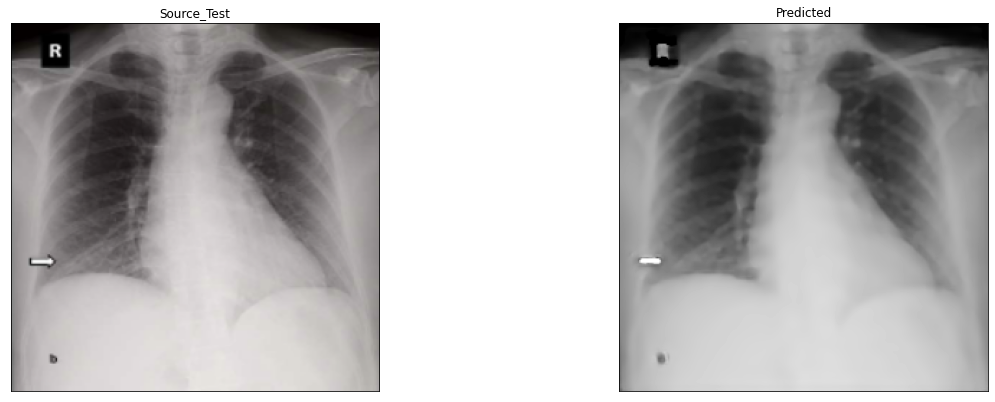

Found 1 images belonging to 1 classes.


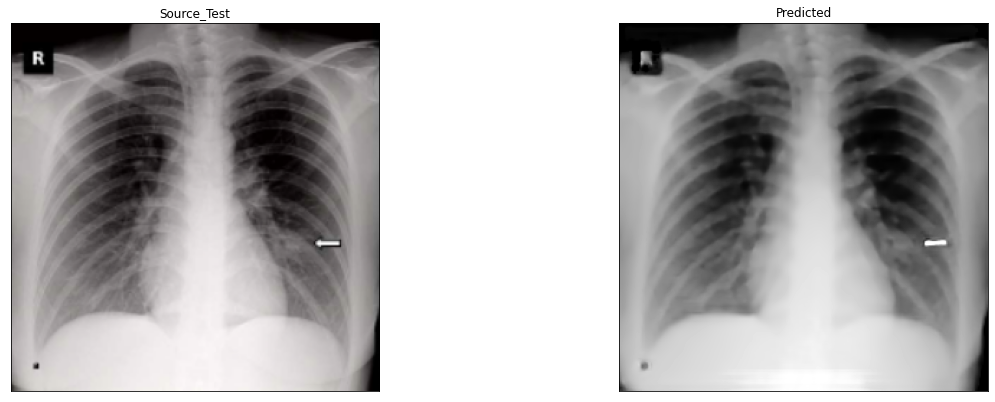

Found 1 images belonging to 1 classes.


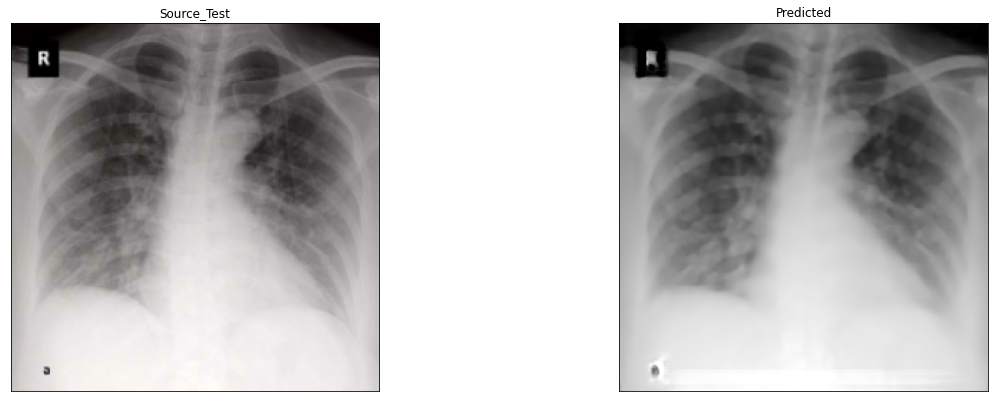

Found 1 images belonging to 1 classes.


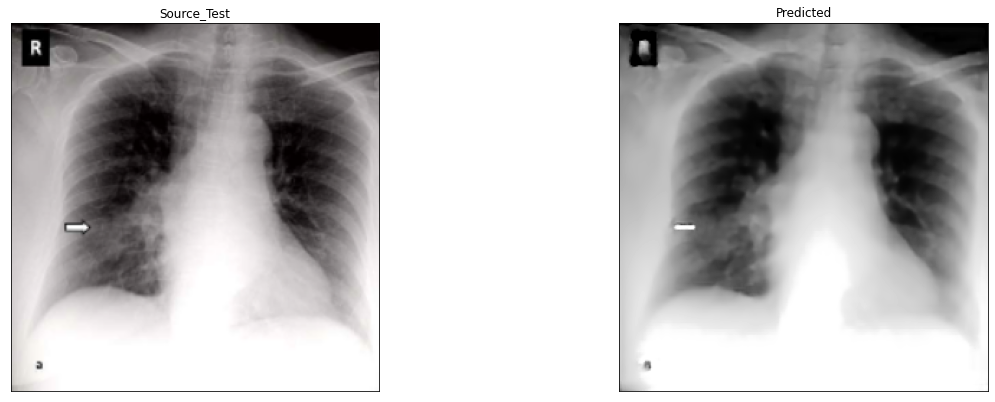

Found 1 images belonging to 1 classes.


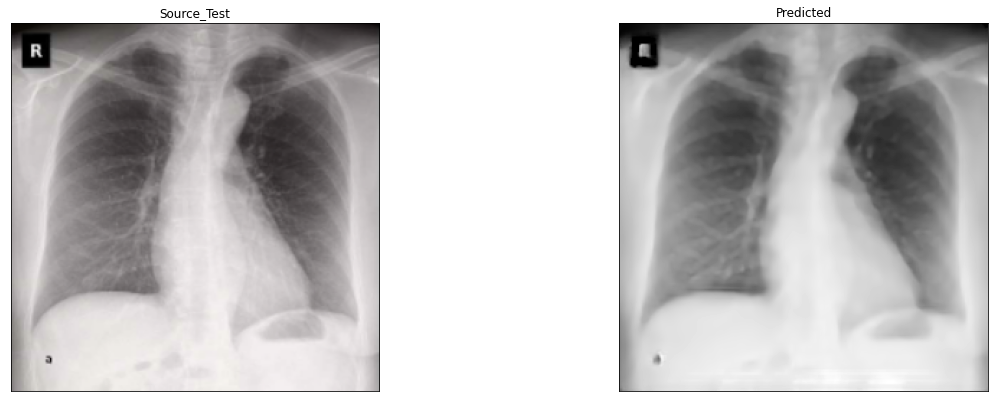

Found 1 images belonging to 1 classes.


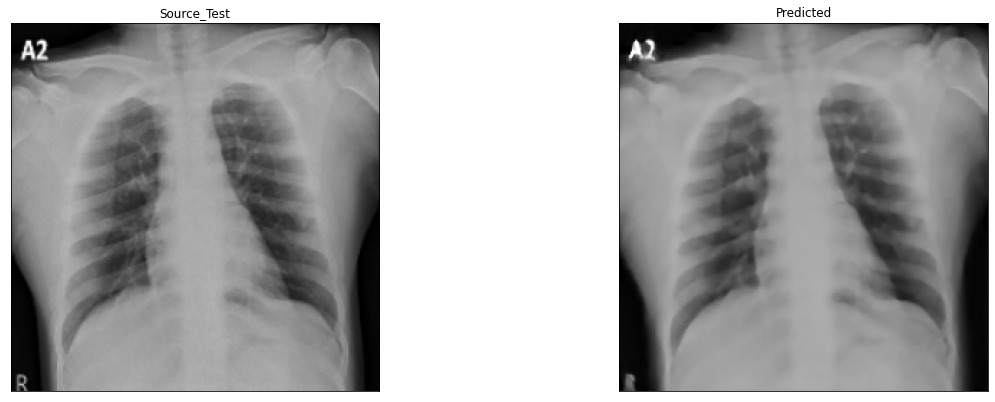

Found 1 images belonging to 1 classes.


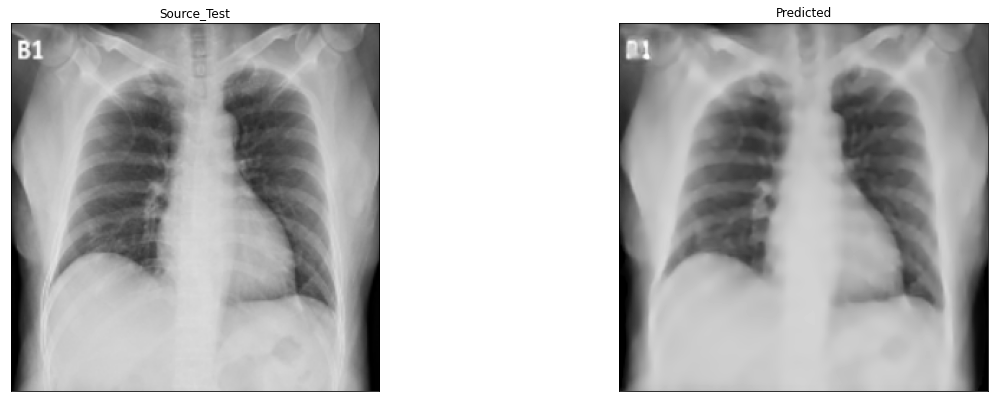

Found 1 images belonging to 1 classes.


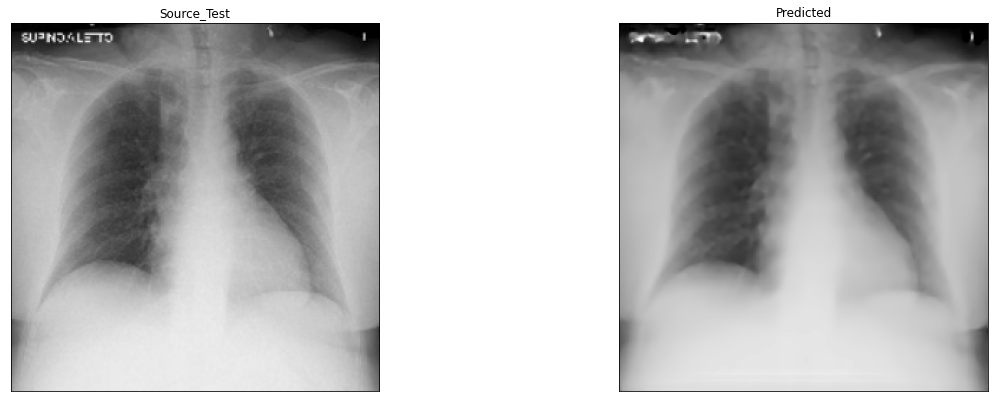

Found 1 images belonging to 1 classes.


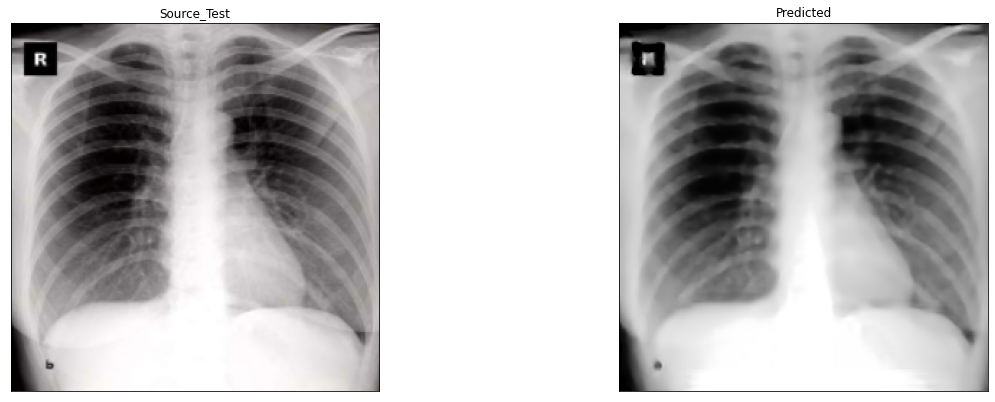

Found 1 images belonging to 1 classes.


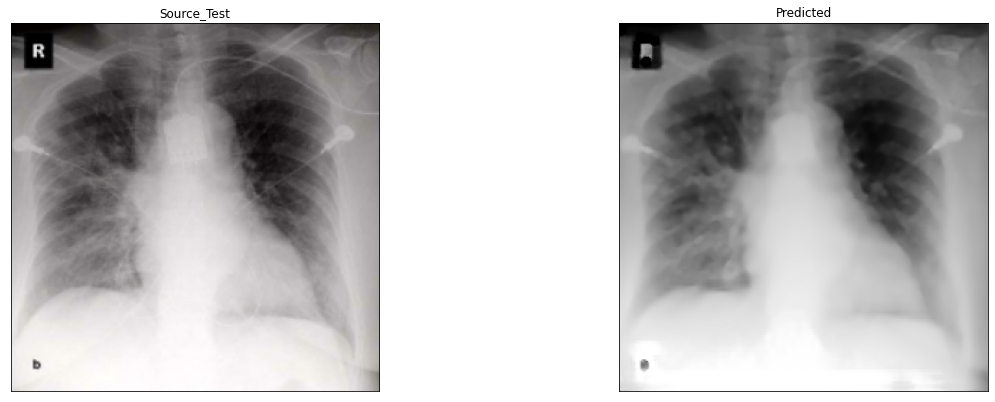

In [ ]:
folder="/content/drive/MyDrive/Bone_supression_research/Test/Test"

arr2=[1,3,5,7,9,11,13,15,17,19]
arr1=[2,4,6,8,10,12,14,16,18,20]
i=0
for filename in os.listdir(folder):
    plt.figure(figsize=(20,80))
    img = cv2.imread(os.path.join(folder,filename))
    img=cv2.resize(img, (256, 256))
    ax = plt.subplot(10, 2, arr2[i])
    plt.imshow(img)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Source_Test')

    
    temp3=os.path.join('/content/Test/Test',filename)
    cv2.imwrite(temp3,img)
    
    tests=trainer.flow_from_directory(
        "/content/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')
    temp_pred=autoencoder.predict(tests)
    os.remove(temp3)
    ax = plt.subplot(10, 2, arr1[i])
    plt.imshow(temp_pred[0].reshape(256,256))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Predicted')
    plt.show()
    i+=1
    

Found 1 images belonging to 1 classes.


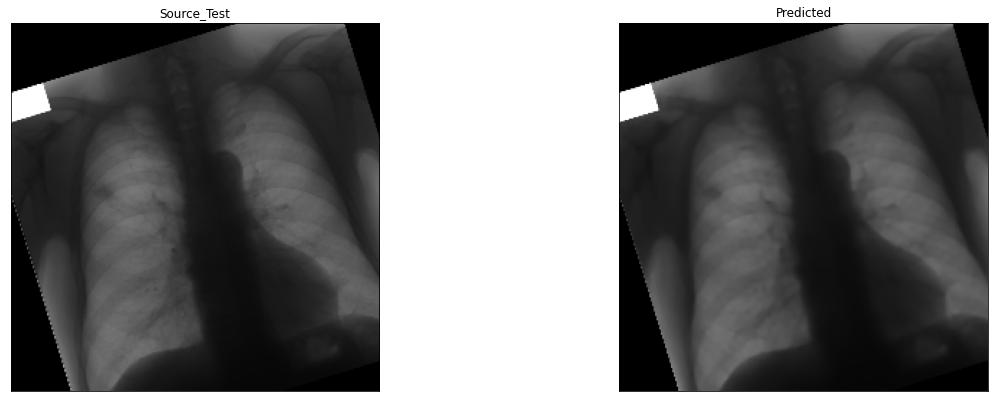

Found 1 images belonging to 1 classes.


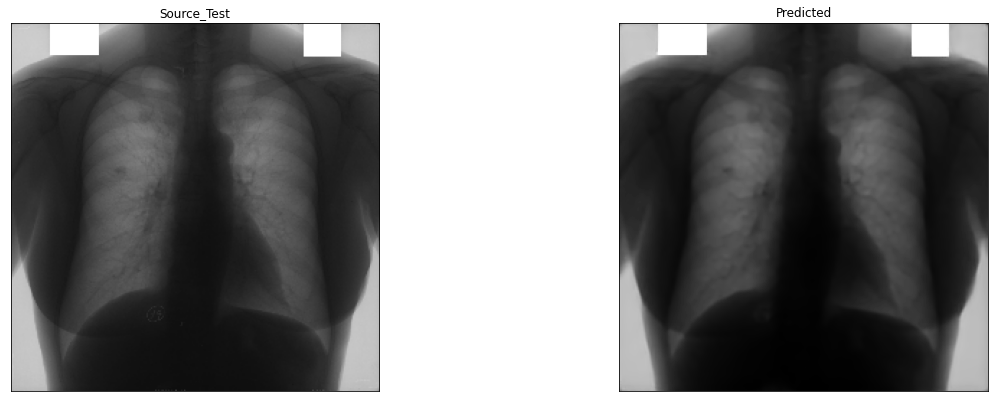

Found 1 images belonging to 1 classes.


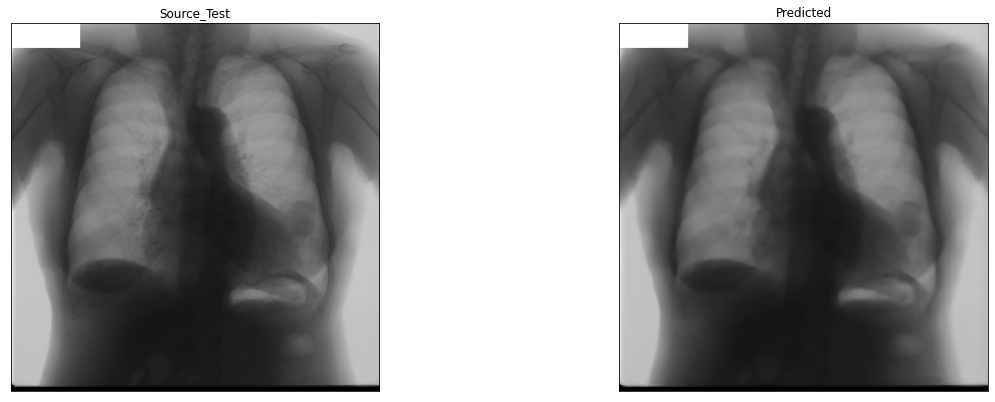

Found 1 images belonging to 1 classes.


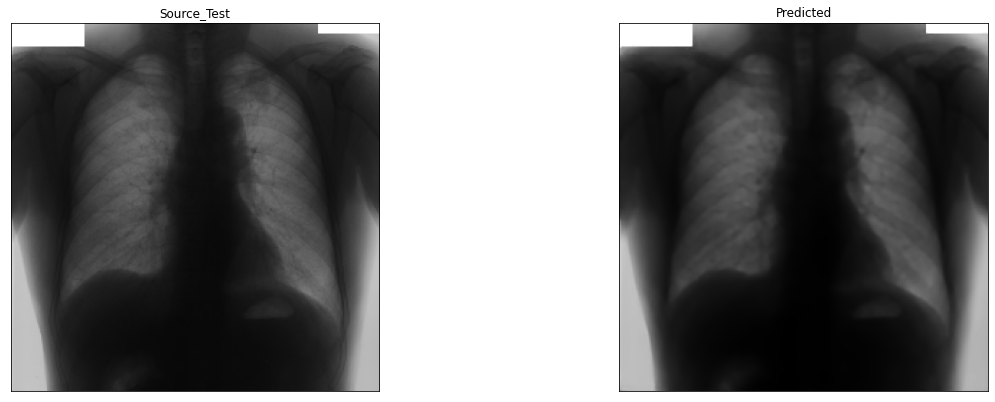

In [ ]:
folder="/content/F"

arr2=[1,3,5,7,9,11,13,15,17,19]
arr1=[2,4,6,8,10,12,14,16,18,20]
i=0
for filename in os.listdir(folder):
    plt.figure(figsize=(20,80))
    img = cv2.imread(os.path.join(folder,filename))
    img=cv2.resize(img, (256, 256))
    ax = plt.subplot(10, 2, arr2[i])
    plt.imshow(img)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Source_Test')

    
    temp3=os.path.join('/content/Test/Test',filename)
    cv2.imwrite(temp3,img)
    
    tests=trainer.flow_from_directory(
        "/content/Test",
        target_size=(256, 256),
        batch_size=32,
        class_mode='input')
    temp_pred=autoencoder.predict(tests)
    os.remove(temp3)
    ax = plt.subplot(10, 2, arr1[i])
    plt.imshow(temp_pred[0].reshape(256,256))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.title('Predicted')
    plt.show()
    i+=1
    